In [1]:
# import necessary libraries 
import pandas as pd
import matplotlib.pyplot as plt
import folium
import nltk 
import string
import seaborn as sns
from nltk.tokenize import word_tokenize
from collections import Counter
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud

In [2]:
# load data
file_path = "C:/Users/dhudi/Downloads/Restaurants.xlsx"
df = pd.read_excel(file_path)

In [3]:
df.shape

(9551, 21)

In [4]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [6]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [7]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [8]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

## Level 1 

### Task 1 : Top Cuisines

In [11]:
df = df.dropna(subset=['Cuisines'])

cuisine_counts = df['Cuisines'].str.split(',').explode().value_counts()

top_3_cuisines = cuisine_counts.head(3)
total_restaurants = len(df)
top_3_percentages = (top_3_cuisines / total_restaurants) * 100

top_cuisines_df = pd.DataFrame({'Cisine': top_3_cuisines.index,
                                'Count': top_3_cuisines.values,
                                'Percentage': top_3_percentages.values})

top_cuisines_df

,Cisine,Count,Percentage
0,North Indian,2992,31.356110
1,Chinese,1880,19.702368
2,Fast Food,1314,13.770698


### Task 2 : City Analysis 

In [13]:
city_counts = df["City"].value_counts()
top_city = city_counts.idxmax()
top_city_count = city_counts.max()

city_avg_rating = df.groupby("City")["Aggregate rating"].mean()

top_rated_city = city_avg_rating.idxmax()
top_rated_city_avg = city_avg_rating.max()

print("1.\n","Highest numbers of restaurants in", top_city, "and \nnumbers of restaurants", top_city_count)
print("2.\n","Average rating for restaurants", city_avg_rating)
print("3.\n","Highest average rating city", top_rated_city, "and \nthere rating", top_rated_city_avg)

1.
 Highest numbers of restaurants in New Delhi and 
numbers of restaurants 5473
2.
 Average rating for restaurants City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.552941
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 140, dtype: float64
3.
 Highest average rating city Inner City and 
there rating 4.9


### Task 3 : Price Range Distribution

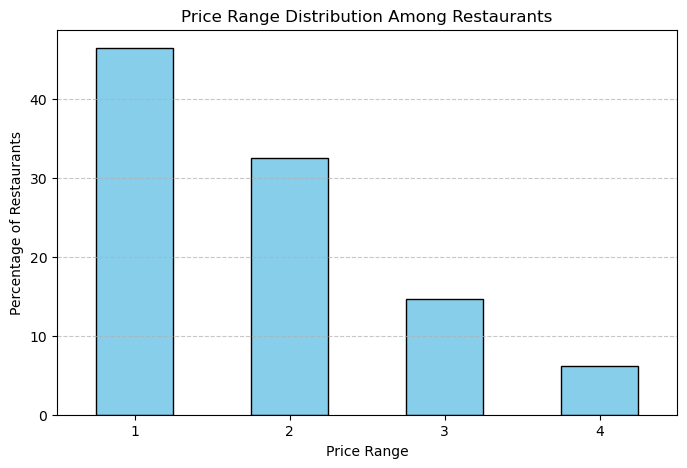

Price range
1    46.510166
2    32.624188
3    14.724376
4     6.141270
Name: proportion, dtype: float64

In [15]:
price_range_counts = df["Price range"].value_counts(normalize=True) * 100

plt.figure(figsize=(8,5))
price_range_counts.sort_index().plot(kind='bar', color='skyblue', edgecolor='black')

plt.xlabel("Price Range")
plt.ylabel("Percentage of Restaurants")
plt.title("Price Range Distribution Among Restaurants")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

price_range_counts

### Task 4 : Online Delivery

In [17]:
df["Has Online delivery"].count()

9542

In [18]:
df["Has Online delivery"].dropna().unique()

array(['No', 'Yes'], dtype=object)

In [19]:
online_delivery_percentage = df["Has Online delivery"].value_counts(normalize=True) * 100
avg_rating_comparison = df.groupby("Has Online delivery")["Aggregate rating"].mean()

online_delivery_percentage, avg_rating_comparison

(Has Online delivery
 No     74.313561
 Yes    25.686439
 Name: proportion, dtype: float64,
 Has Online delivery
 No     2.463517
 Yes    3.248837
 Name: Aggregate rating, dtype: float64)

## Level 2

### Task 1 : Restaurant ratings

In [22]:
most_commomn_rating_range = df['Aggregate rating'].round().mode()[0]
average_votes = df['Votes'].mean()
print("common rating range", most_commomn_rating_range)
print("average numbers of votes", average_votes)

common rating range 3.0
average numbers of votes 156.7720603647034


### Task 2 : Cuisine Combination

In [24]:
df_cuisines = df[['Cuisines', 'Aggregate rating']]
common_cuisine_combinations = df_cuisines['Cuisines'].value_counts().head(10)
cuisine_rating = df_cuisines.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(10)

print("common combinations of ", common_cuisine_combinations)
print("cusines combinations tend to have high ratings", cuisine_rating)

common combinations of  Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64
cusines combinations tend to have high ratings Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


### Task 3 : Geographic Analysis

In [26]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [27]:
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
m = folium.Map(location=map_center, zoom_start=12)

for index, row in df.iterrows():
    folium.Marker([row["Latitude"], row["Longitude"]], 
                  popup=row["Restaurant Name"]).add_to(m)

m.save("restaurants_map.html")
m

### Task 4 : Restaurant Chains

In [29]:
chain_counts = df["Restaurant Name"].value_counts()
chains = chain_counts[chain_counts > 1].index.tolist()  # Restaurants appearing more than once

chain_data = df[df["Restaurant Name"].isin(chains)]

chain_analysis = chain_data.groupby("Restaurant Name").agg(
    Avg_Rating=("Aggregate rating", "mean"),
    Total_Votes=("Votes", "sum"),
    Locations=("Restaurant Name", "count")
).reset_index()

chain_analysis = chain_analysis.sort_values(by="Total_Votes", ascending=False)

print(chain_analysis)

               Restaurant Name  Avg_Rating  Total_Votes  Locations
62             Barbeque Nation    4.353846        28142         26
7    AB's - Absolute Barbecues    4.825000        13400          4
79                   Big Chill    4.475000        10853          4
239                 Farzi Cafe    4.366667        10098          6
692                   Truffles    3.950000         9682          2
..                         ...         ...          ...        ...
86     Bikaner Misthan Bhandar    0.000000            0          2
9                Aap Ki Khatir    0.000000            0          2
616                Street Cafe    0.000000            0          2
343               Jyoti Sweets    0.000000            0          2
243               Firangi Bake    0.000000            0          2

[734 rows x 4 columns]


## Level 3

### Task 1 : Restaurant Reviews

In [32]:
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('vader_lexicon')

In [33]:
def clean_text(text):
    text = str(text).lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = nltk.word_tokenize(text)
    tokens = [word for word in tokens if word not in stopwords.words('english')]
    return tokens

df['Tokens'] = df['Rating text'].apply(clean_text)

all_words = [word for tokens in df['Tokens'] for word in tokens]
freq_dist = nltk.FreqDist(all_words)

sia = SentimentIntensityAnalyzer()

positive_words = []
negative_words = []

for word in set(all_words):
    score = sia.polarity_scores(word)['compound']
    if score >= 0:
        positive_words.append(word)
    elif score <= -0:
        negative_words.append(word)

print("\nTop 5 Positive Keywords:")
print(sorted(positive_words, key=lambda w: freq_dist[w], reverse=True)[:5])

print("\nTop 5 Negative Keywords:")
print(sorted(negative_words, key=lambda w: freq_dist[w], reverse=True)[:5])

df['Review Length'] = df['Rating text'].apply(lambda x: len(str(x).split()))
avg_length = df['Review Length'].mean()
print(f"\nAverage Review Length: {avg_length:.2f} words")


Top 5 Positive Keywords:
['average', 'good', 'rated', 'excellent']

Top 5 Negative Keywords:
['poor']

Average Review Length: 1.34 words


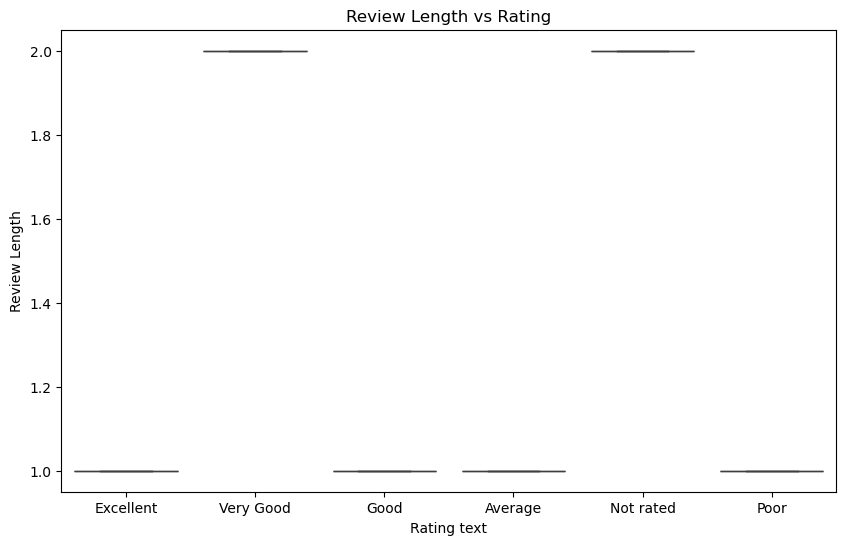

In [34]:
# Relationship: Review Length vs Rating
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Rating text', y='Review Length')
plt.title("Review Length vs Rating")
plt.show()

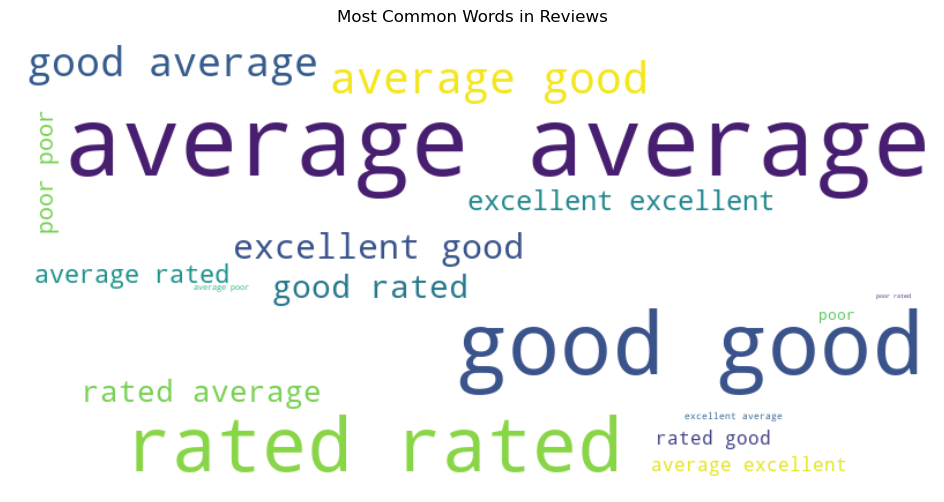

In [35]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(all_words))
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Most Common Words in Reviews")
plt.show()

### Task 2 : Votes Analysis

In [37]:
# Convert votes to numeric if needed
df['Votes'] = pd.to_numeric(df['Votes'], errors='coerce')
df['Aggregate rating'] = pd.to_numeric(df['Aggregate rating'], errors='coerce')

# Drop rows with missing values in Votes or Rating
df_clean = df.dropna(subset=['Votes', 'Aggregate rating'])

In [38]:
# Highest votes
most_voted = df_clean[df_clean['Votes'] == df_clean['Votes'].max()]
print("Restaurant(s) with highest votes:")
print(most_voted[['Restaurant Name', 'Votes', 'Aggregate rating']])

# Lowest votes (greater than 0)
least_voted = df_clean[df_clean['Votes'] == df_clean['Votes'].min()]
print("\nRestaurant(s) with lowest votes:")
print(least_voted[['Restaurant Name', 'Votes', 'Aggregate rating']])

Restaurant(s) with highest votes:
    Restaurant Name  Votes  Aggregate rating
728            Toit  10934               4.8

Restaurant(s) with lowest votes:
                 Restaurant Name  Votes  Aggregate rating
69              Cantinho da Gula      0               0.0
874                The Chaiwalas      0               0.0
879           Fusion Food Corner      0               0.0
880                Punjabi Rasoi      0               0.0
887                Baskin Robbin      0               0.0
...                          ...    ...               ...
9044               6 Packs Momos      0               0.0
9098                   Cafe' Wow      0               0.0
9099  Chef's Basket Pop Up Caf��      0               0.0
9103            The Hangout-Deli      0               0.0
9111                    Platters      0               0.0

[1094 rows x 3 columns]


In [39]:
# Calculate correlation
correlation = df_clean['Votes'].corr(df_clean['Aggregate rating'])
print(f"\nCorrelation between Votes and Rating: {correlation:.4f}")


Correlation between Votes and Rating: 0.3135


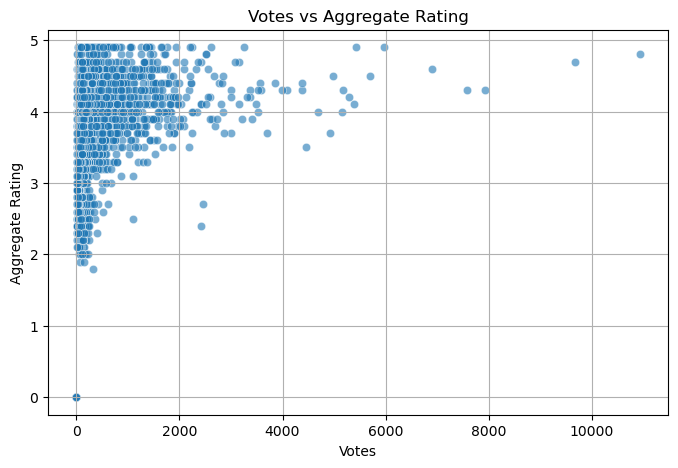

In [40]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_clean, x='Votes', y='Aggregate rating', alpha=0.6)
plt.title('Votes vs Aggregate Rating')
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.grid(True)
plt.show()

### Task 3 : Price Range VS. Online Delivery and Table Booking

In [42]:
# Standardize values if needed
df['Has Online delivery	'] = df['Has Online delivery'].str.strip().str.lower()
df['Has Table booking'] = df['Has Table booking'].str.strip().str.lower()

# Filter only required columns
df_filtered = df[['Price range', 'Has Online delivery', 'Has Table booking']].dropna()

In [43]:
delivery_vs_price = pd.crosstab(df_filtered['Price range'], df_filtered['Has Online delivery'], normalize='index') * 100
print("Has Online Delivery % by Price Range:")
print(delivery_vs_price)

Has Online Delivery % by Price Range:
Has Online delivery         No        Yes
Price range                              
1                    84.204597  15.795403
2                    58.689367  41.310633
3                    70.747331  29.252669
4                    90.955631   9.044369


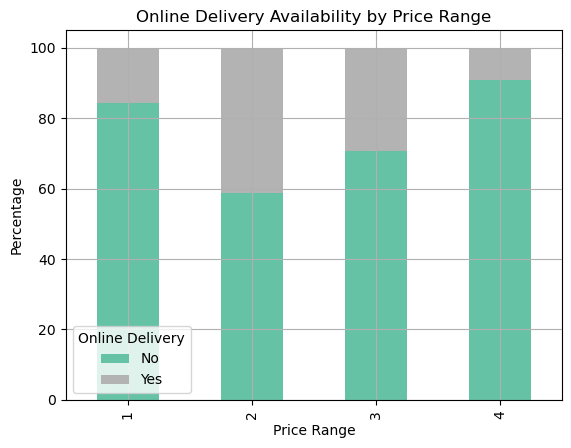

In [44]:
# Online delivery
delivery_vs_price.plot(kind='bar', stacked=True, colormap='Set2')
plt.title('Online Delivery Availability by Price Range')
plt.ylabel('Percentage')
plt.xlabel('Price Range')
plt.legend(title='Online Delivery')
plt.grid(True)
plt.show()

In [45]:
booking_vs_price = pd.crosstab(df_filtered['Price range'], df_filtered['Has Table booking'], normalize='index') * 100
print("Has Table booking % by Price Range:")
print(booking_vs_price)

Has Table booking % by Price Range:
Has Table booking         no        yes
Price range                            
1                  99.977467   0.022533
2                  92.322518   7.677482
3                  54.163701  45.836299
4                  53.242321  46.757679


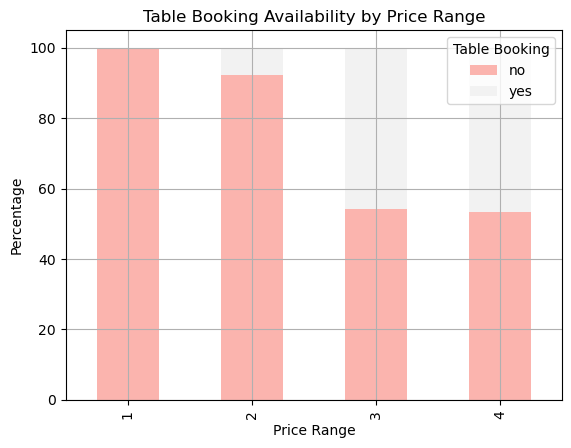

In [46]:
# Table booking
booking_vs_price.plot(kind='bar', stacked=True, colormap='Pastel1')
plt.title('Table Booking Availability by Price Range')
plt.ylabel('Percentage')
plt.xlabel('Price Range')
plt.legend(title='Table Booking')
plt.grid(True)
plt.show()